In [1]:
from minisom import MiniSom
import pandas as pd
import numpy as np
from collections import defaultdict
import pickle
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data_path = '/net/fs04/d2/xgao/SOM'

In [3]:
som_shape = (3, 4)
x = som_shape[0]
y = som_shape[1]

In [4]:
output_path = '../results/'+str(x)+'x'+str(y)+'/'

In [5]:
def get_var(var, prod):
    df = pd.read_csv(data_path+'/'+prod+'/'+prod+'_daily_8019_SCUS_JFMAMOND_'+var+'_anom.txt', header = None, delim_whitespace=True)
    return df

In [6]:
def concat_df(df_list):
    comb_df = pd.concat(df_list, axis = 1)
    comb = comb_df.values
    return comb

In [7]:
def num_days_node(winmap):
    for cell in sorted(winmap.keys()):
        print(cell, len(winmap[cell]))

In [8]:
def get_winmap(data, som, return_indices = True):
    winmap = defaultdict(list)
    for i, j in enumerate(data):
        winmap[som.winner(j)].append(i+1 if return_indices else j)
    return winmap

In [9]:
def get_node_composites(som, data):
    winmap_patt = som.win_map(data)
    composites = {}
    for node in sorted(winmap_patt.keys()):
        composites[node] = np.mean(np.array(winmap_patt[node]), axis = 0)
    return composites

In [10]:
# for 3x4 or 4x3 figsize = ((15,12))
def plot_som(composites, reanalysis_product):
    plt.tight_layout()
    fig, axs = plt.subplots(nrows = som_shape[0], ncols = som_shape[1], figsize = (15,8))
    fig.suptitle(reanalysis_product, fontsize=25, x=0.4, y=.92, horizontalalignment='left', verticalalignment='top',)

    for ax, node in zip(axs.flat, composites.keys()):
        im = ax.imshow(composites[node].reshape((41,49)), interpolation='nearest', cmap='hot')
    
    
    
    fig.subplots_adjust(top=0.88)
    
    plt.colorbar(im, ax=axs.ravel().tolist())
    plt.show()

In [11]:
# def save_composites(reanalysis_product, composites):
#     filename = output_path + reanalysis_product + '_composites.json'
#     file = open(filename, 'wb')
#     pickle.dump(composites, file)
#     file.close()

In [12]:
#changed sigma from 0.5 and learning_rate from 0.5

#1, 0.01

sigma = 1
learning_rate = 0.01
neighbourhood_function = 'gaussian'
random_seed = 10
# iterations = 5000
# verbose = True

In [13]:
# rs = []
# for i in range(len(data_ERA5)):
#     r, _ = stats.pearsonr(data_ERA5[i], data_MERRA2[i])
#     rs.append(r)

In [14]:
# plt.plot(rs)
# print(np.mean(rs))

In [15]:
# rs = []
# for i in range(len(data_ERA5)):
#     r, _ = stats.pearsonr(data_ERA5[i], data_NARR[i])
#     rs.append(r)

In [16]:
# plt.plot(rs)
# print(np.mean(rs))

In [17]:
ivt_ERA5_df = get_var('ivt','ERA5')

ERA5 = concat_df([ivt_ERA5_df])
data_ERA5 = np.copy(ERA5)
np.random.seed(10)
# np.random.shuffle(data_ERA5)

input_len = data_ERA5.shape[1]
iterations = len(data_ERA5)*10

som_ERA5 = MiniSom(x , y, input_len, sigma=sigma, learning_rate=learning_rate,
              neighborhood_function=neighbourhood_function, random_seed=random_seed)
# som_ERA5.train_random(data_ERA5, iterations, verbose=True)
som_ERA5.train(data_ERA5, iterations, verbose=True)

 [   252 / 97300 ]   0% - 0:01:17 left 

 [   516 / 97300 ]   1% - 0:01:15 left 

 [   781 / 97300 ]   1% - 0:01:14 left 

 [  1047 / 97300 ]   1% - 0:01:14 left 

 [  1314 / 97300 ]   1% - 0:01:13 left 

 [  1579 / 97300 ]   2% - 0:01:13 left 

 [  1840 / 97300 ]   2% - 0:01:13 left 

 [  2102 / 97300 ]   2% - 0:01:13 left 

 [  2364 / 97300 ]   2% - 0:01:12 left 

 [  2626 / 97300 ]   3% - 0:01:12 left 

 [  2888 / 97300 ]   3% - 0:01:12 left 

 [  3152 / 97300 ]   3% - 0:01:12 left 

 [  3414 / 97300 ]   4% - 0:01:12 left 

 [  3675 / 97300 ]   4% - 0:01:11 left 

 [  3937 / 97300 ]   4% - 0:01:11 left 

 [  4200 / 97300 ]   4% - 0:01:11 left 

 [  4462 / 97300 ]   5% - 0:01:11 left 

 [  4725 / 97300 ]   5% - 0:01:11 left 

 [  4977 / 97300 ]   5% - 0:01:11 left 

 [  5240 / 97300 ]   5% - 0:01:10 left 

 [  5503 / 97300 ]   6% - 0:01:10 left 

 [  5767 / 97300 ]   6% - 0:01:10 left 

 [  6030 / 97300 ]   6% - 0:01:10 left 

 [  6287 / 97300 ]   6% - 0:01:10 left 

 [  6549 / 97300 ]   7% - 0:01:09 left 

 [  6812 / 97300 ]   7% - 0:01:09 left 

 [  7074 / 97300 ]   7% - 0:01:09 left 

 [  7338 / 97300 ]   8% - 0:01:09 left 

 [  7589 / 97300 ]   8% - 0:01:09 left 

 [  7853 / 97300 ]   8% - 0:01:08 left 

 [  8117 / 97300 ]   8% - 0:01:08 left 

 [  8381 / 97300 ]   9% - 0:01:08 left 

 [  8644 / 97300 ]   9% - 0:01:08 left 

 [  8907 / 97300 ]   9% - 0:01:08 left 

 [  9159 / 97300 ]   9% - 0:01:07 left 

 [  9420 / 97300 ]  10% - 0:01:07 left 

 [  9681 / 97300 ]  10% - 0:01:07 left 

 [  9940 / 97300 ]  10% - 0:01:07 left 

 [ 10203 / 97300 ]  10% - 0:01:07 left 

 [ 10465 / 97300 ]  11% - 0:01:06 left 

 [ 10730 / 97300 ]  11% - 0:01:06 left 

 [ 10991 / 97300 ]  11% - 0:01:06 left 

 [ 11253 / 97300 ]  12% - 0:01:06 left 

 [ 11513 / 97300 ]  12% - 0:01:06 left 

 [ 11773 / 97300 ]  12% - 0:01:05 left 

 [ 12034 / 97300 ]  12% - 0:01:05 left 

 [ 12293 / 97300 ]  13% - 0:01:05 left 

 [ 12553 / 97300 ]  13% - 0:01:05 left 

 [ 12816 / 97300 ]  13% - 0:01:05 left 

 [ 13078 / 97300 ]  13% - 0:01:04 left 

 [ 13339 / 97300 ]  14% - 0:01:04 left 

 [ 13591 / 97300 ]  14% - 0:01:04 left 

 [ 13851 / 97300 ]  14% - 0:01:04 left 

 [ 14112 / 97300 ]  15% - 0:01:04 left 

 [ 14373 / 97300 ]  15% - 0:01:04 left 

 [ 14633 / 97300 ]  15% - 0:01:03 left 

 [ 14892 / 97300 ]  15% - 0:01:03 left 

 [ 15153 / 97300 ]  16% - 0:01:03 left 

 [ 15415 / 97300 ]  16% - 0:01:03 left 

 [ 15680 / 97300 ]  16% - 0:01:03 left 

 [ 15944 / 97300 ]  16% - 0:01:02 left 

 [ 16204 / 97300 ]  17% - 0:01:02 left 

 [ 16467 / 97300 ]  17% - 0:01:02 left 

 [ 16728 / 97300 ]  17% - 0:01:02 left 

 [ 16991 / 97300 ]  17% - 0:01:01 left 

 [ 17252 / 97300 ]  18% - 0:01:01 left 

 [ 17515 / 97300 ]  18% - 0:01:01 left 

 [ 17777 / 97300 ]  18% - 0:01:01 left 

 [ 18041 / 97300 ]  19% - 0:01:01 left 

 [ 18301 / 97300 ]  19% - 0:01:00 left 

 [ 18560 / 97300 ]  19% - 0:01:00 left 

 [ 18819 / 97300 ]  19% - 0:01:00 left 

 [ 19080 / 97300 ]  20% - 0:01:00 left 

 [ 19340 / 97300 ]  20% - 0:01:00 left 

 [ 19600 / 97300 ]  20% - 0:00:59 left 

 [ 19861 / 97300 ]  20% - 0:00:59 left 

 [ 20124 / 97300 ]  21% - 0:00:59 left 

 [ 20388 / 97300 ]  21% - 0:00:59 left 

 [ 20649 / 97300 ]  21% - 0:00:59 left 

 [ 20911 / 97300 ]  21% - 0:00:58 left 

 [ 21171 / 97300 ]  22% - 0:00:58 left 

 [ 21430 / 97300 ]  22% - 0:00:58 left 

 [ 21690 / 97300 ]  22% - 0:00:58 left 

 [ 21951 / 97300 ]  23% - 0:00:58 left 

 [ 22211 / 97300 ]  23% - 0:00:57 left 

 [ 22473 / 97300 ]  23% - 0:00:57 left 

 [ 22734 / 97300 ]  23% - 0:00:57 left 

 [ 22995 / 97300 ]  24% - 0:00:57 left 

 [ 23258 / 97300 ]  24% - 0:00:57 left 

 [ 23521 / 97300 ]  24% - 0:00:56 left 

 [ 23779 / 97300 ]  24% - 0:00:56 left 

 [ 24040 / 97300 ]  25% - 0:00:56 left 

 [ 24302 / 97300 ]  25% - 0:00:56 left 

 [ 24549 / 97300 ]  25% - 0:00:56 left 

 [ 24815 / 97300 ]  26% - 0:00:55 left 

 [ 25097 / 97300 ]  26% - 0:00:55 left 

 [ 25362 / 97300 ]  26% - 0:00:55 left 

 [ 25626 / 97300 ]  26% - 0:00:55 left 

 [ 25887 / 97300 ]  27% - 0:00:55 left 

 [ 26149 / 97300 ]  27% - 0:00:54 left 

 [ 26411 / 97300 ]  27% - 0:00:54 left 

 [ 26674 / 97300 ]  27% - 0:00:54 left 

 [ 26935 / 97300 ]  28% - 0:00:54 left 

 [ 27197 / 97300 ]  28% - 0:00:54 left 

 [ 27460 / 97300 ]  28% - 0:00:53 left 

 [ 27724 / 97300 ]  28% - 0:00:53 left 

 [ 27987 / 97300 ]  29% - 0:00:53 left 

 [ 28250 / 97300 ]  29% - 0:00:53 left 

 [ 28514 / 97300 ]  29% - 0:00:53 left 

 [ 28780 / 97300 ]  30% - 0:00:52 left 

 [ 29045 / 97300 ]  30% - 0:00:52 left 

 [ 29308 / 97300 ]  30% - 0:00:52 left 

 [ 29572 / 97300 ]  30% - 0:00:52 left 

 [ 29833 / 97300 ]  31% - 0:00:52 left 

 [ 30093 / 97300 ]  31% - 0:00:51 left 

 [ 30356 / 97300 ]  31% - 0:00:51 left 

 [ 30618 / 97300 ]  31% - 0:00:51 left 

 [ 30881 / 97300 ]  32% - 0:00:51 left 

 [ 31137 / 97300 ]  32% - 0:00:51 left 

 [ 31400 / 97300 ]  32% - 0:00:50 left 

 [ 31661 / 97300 ]  33% - 0:00:50 left 

 [ 31925 / 97300 ]  33% - 0:00:50 left 

 [ 32187 / 97300 ]  33% - 0:00:50 left 

 [ 32450 / 97300 ]  33% - 0:00:49 left 

 [ 32714 / 97300 ]  34% - 0:00:49 left 

 [ 32977 / 97300 ]  34% - 0:00:49 left 

 [ 33240 / 97300 ]  34% - 0:00:49 left 

 [ 33502 / 97300 ]  34% - 0:00:49 left 

 [ 33765 / 97300 ]  35% - 0:00:48 left 

 [ 34030 / 97300 ]  35% - 0:00:48 left 

 [ 34293 / 97300 ]  35% - 0:00:48 left 

 [ 34556 / 97300 ]  36% - 0:00:48 left 

 [ 34820 / 97300 ]  36% - 0:00:48 left 

 [ 35081 / 97300 ]  36% - 0:00:47 left 

 [ 35344 / 97300 ]  36% - 0:00:47 left 

 [ 35608 / 97300 ]  37% - 0:00:47 left 

 [ 35871 / 97300 ]  37% - 0:00:47 left 

 [ 36135 / 97300 ]  37% - 0:00:47 left 

 [ 36398 / 97300 ]  37% - 0:00:46 left 

 [ 36658 / 97300 ]  38% - 0:00:46 left 

 [ 36919 / 97300 ]  38% - 0:00:46 left 

 [ 37181 / 97300 ]  38% - 0:00:46 left 

 [ 37442 / 97300 ]  38% - 0:00:46 left 

 [ 37705 / 97300 ]  39% - 0:00:45 left 

 [ 37967 / 97300 ]  39% - 0:00:45 left 

 [ 38227 / 97300 ]  39% - 0:00:45 left 

 [ 38488 / 97300 ]  40% - 0:00:45 left 

 [ 38750 / 97300 ]  40% - 0:00:45 left 

 [ 39012 / 97300 ]  40% - 0:00:44 left 

 [ 39269 / 97300 ]  40% - 0:00:44 left 

 [ 39530 / 97300 ]  41% - 0:00:44 left 

 [ 39790 / 97300 ]  41% - 0:00:44 left 

 [ 40052 / 97300 ]  41% - 0:00:44 left 

 [ 40314 / 97300 ]  41% - 0:00:43 left 

 [ 40576 / 97300 ]  42% - 0:00:43 left 

 [ 40838 / 97300 ]  42% - 0:00:43 left 

 [ 41102 / 97300 ]  42% - 0:00:43 left 

 [ 41365 / 97300 ]  43% - 0:00:43 left 

 [ 41627 / 97300 ]  43% - 0:00:42 left 

 [ 41889 / 97300 ]  43% - 0:00:42 left 

 [ 42152 / 97300 ]  43% - 0:00:42 left 

 [ 42414 / 97300 ]  44% - 0:00:42 left 

 [ 42665 / 97300 ]  44% - 0:00:42 left 

 [ 42926 / 97300 ]  44% - 0:00:41 left 

 [ 43188 / 97300 ]  44% - 0:00:41 left 

 [ 43449 / 97300 ]  45% - 0:00:41 left 

 [ 43709 / 97300 ]  45% - 0:00:41 left 

 [ 43971 / 97300 ]  45% - 0:00:41 left 

 [ 44233 / 97300 ]  45% - 0:00:40 left 

 [ 44496 / 97300 ]  46% - 0:00:40 left 

 [ 44756 / 97300 ]  46% - 0:00:40 left 

 [ 45016 / 97300 ]  46% - 0:00:40 left 

 [ 45276 / 97300 ]  47% - 0:00:40 left 

 [ 45537 / 97300 ]  47% - 0:00:39 left 

 [ 45797 / 97300 ]  47% - 0:00:39 left 

 [ 46058 / 97300 ]  47% - 0:00:39 left 

 [ 46319 / 97300 ]  48% - 0:00:39 left 

 [ 46580 / 97300 ]  48% - 0:00:39 left 

 [ 46841 / 97300 ]  48% - 0:00:38 left 

 [ 47101 / 97300 ]  48% - 0:00:38 left 

 [ 47362 / 97300 ]  49% - 0:00:38 left 

 [ 47624 / 97300 ]  49% - 0:00:38 left 

 [ 47884 / 97300 ]  49% - 0:00:38 left 

 [ 48147 / 97300 ]  49% - 0:00:37 left 

 [ 48409 / 97300 ]  50% - 0:00:37 left 

 [ 48671 / 97300 ]  50% - 0:00:37 left 

 [ 48931 / 97300 ]  50% - 0:00:37 left 

 [ 49191 / 97300 ]  51% - 0:00:37 left 

 [ 49452 / 97300 ]  51% - 0:00:36 left 

 [ 49710 / 97300 ]  51% - 0:00:36 left 

 [ 49973 / 97300 ]  51% - 0:00:36 left 

 [ 50235 / 97300 ]  52% - 0:00:36 left 

 [ 50496 / 97300 ]  52% - 0:00:36 left 

 [ 50755 / 97300 ]  52% - 0:00:35 left 

 [ 51014 / 97300 ]  52% - 0:00:35 left 

 [ 51274 / 97300 ]  53% - 0:00:35 left 

 [ 51533 / 97300 ]  53% - 0:00:35 left 

 [ 51794 / 97300 ]  53% - 0:00:35 left 

 [ 52056 / 97300 ]  54% - 0:00:34 left 

 [ 52318 / 97300 ]  54% - 0:00:34 left 

 [ 52581 / 97300 ]  54% - 0:00:34 left 

 [ 52842 / 97300 ]  54% - 0:00:34 left 

 [ 53104 / 97300 ]  55% - 0:00:34 left 

 [ 53366 / 97300 ]  55% - 0:00:33 left 

 [ 53628 / 97300 ]  55% - 0:00:33 left 

 [ 53889 / 97300 ]  55% - 0:00:33 left 

 [ 54153 / 97300 ]  56% - 0:00:33 left 

 [ 54415 / 97300 ]  56% - 0:00:33 left 

 [ 54678 / 97300 ]  56% - 0:00:32 left 

 [ 54939 / 97300 ]  56% - 0:00:32 left 

 [ 55202 / 97300 ]  57% - 0:00:32 left 

 [ 55464 / 97300 ]  57% - 0:00:32 left 

 [ 55726 / 97300 ]  57% - 0:00:32 left 

 [ 55988 / 97300 ]  58% - 0:00:31 left 

 [ 56251 / 97300 ]  58% - 0:00:31 left 

 [ 56512 / 97300 ]  58% - 0:00:31 left 

 [ 56773 / 97300 ]  58% - 0:00:31 left 

 [ 57034 / 97300 ]  59% - 0:00:31 left 

 [ 57297 / 97300 ]  59% - 0:00:30 left 

 [ 57560 / 97300 ]  59% - 0:00:30 left 

 [ 57823 / 97300 ]  59% - 0:00:30 left 

 [ 58086 / 97300 ]  60% - 0:00:30 left 

 [ 58348 / 97300 ]  60% - 0:00:30 left 

 [ 58610 / 97300 ]  60% - 0:00:29 left 

 [ 58874 / 97300 ]  61% - 0:00:29 left 

 [ 59136 / 97300 ]  61% - 0:00:29 left 

 [ 59396 / 97300 ]  61% - 0:00:29 left 

 [ 59658 / 97300 ]  61% - 0:00:29 left 

 [ 59922 / 97300 ]  62% - 0:00:28 left 

 [ 60186 / 97300 ]  62% - 0:00:28 left 

 [ 60437 / 97300 ]  62% - 0:00:28 left 

 [ 60699 / 97300 ]  62% - 0:00:28 left 

 [ 60963 / 97300 ]  63% - 0:00:28 left 

 [ 61224 / 97300 ]  63% - 0:00:27 left 

 [ 61490 / 97300 ]  63% - 0:00:27 left 

 [ 61755 / 97300 ]  63% - 0:00:27 left 

 [ 62017 / 97300 ]  64% - 0:00:27 left 

 [ 62280 / 97300 ]  64% - 0:00:27 left 

 [ 62544 / 97300 ]  64% - 0:00:26 left 

 [ 62808 / 97300 ]  65% - 0:00:26 left 

 [ 63074 / 97300 ]  65% - 0:00:26 left 

 [ 63338 / 97300 ]  65% - 0:00:26 left 

 [ 63599 / 97300 ]  65% - 0:00:25 left 

 [ 63862 / 97300 ]  66% - 0:00:25 left 

 [ 64127 / 97300 ]  66% - 0:00:25 left 

 [ 64393 / 97300 ]  66% - 0:00:25 left 

 [ 64657 / 97300 ]  66% - 0:00:25 left 

 [ 64919 / 97300 ]  67% - 0:00:24 left 

 [ 65181 / 97300 ]  67% - 0:00:24 left 

 [ 65444 / 97300 ]  67% - 0:00:24 left 

 [ 65711 / 97300 ]  68% - 0:00:24 left 

 [ 65971 / 97300 ]  68% - 0:00:24 left 

 [ 66231 / 97300 ]  68% - 0:00:23 left 

 [ 66491 / 97300 ]  68% - 0:00:23 left 

 [ 66749 / 97300 ]  69% - 0:00:23 left 

 [ 67010 / 97300 ]  69% - 0:00:23 left 

 [ 67272 / 97300 ]  69% - 0:00:23 left 

 [ 67535 / 97300 ]  69% - 0:00:22 left 

 [ 67797 / 97300 ]  70% - 0:00:22 left 

 [ 68041 / 97300 ]  70% - 0:00:22 left 

 [ 68300 / 97300 ]  70% - 0:00:22 left 

 [ 68562 / 97300 ]  70% - 0:00:22 left 

 [ 68826 / 97300 ]  71% - 0:00:21 left 

 [ 69090 / 97300 ]  71% - 0:00:21 left 

 [ 69352 / 97300 ]  71% - 0:00:21 left 

 [ 69616 / 97300 ]  72% - 0:00:21 left 

 [ 69880 / 97300 ]  72% - 0:00:21 left 

 [ 70143 / 97300 ]  72% - 0:00:20 left 

 [ 70407 / 97300 ]  72% - 0:00:20 left 

 [ 70672 / 97300 ]  73% - 0:00:20 left 

 [ 70935 / 97300 ]  73% - 0:00:20 left 

 [ 71200 / 97300 ]  73% - 0:00:20 left 

 [ 71464 / 97300 ]  73% - 0:00:19 left 

 [ 71729 / 97300 ]  74% - 0:00:19 left 

 [ 71994 / 97300 ]  74% - 0:00:19 left 

 [ 72260 / 97300 ]  74% - 0:00:19 left 

 [ 72525 / 97300 ]  75% - 0:00:19 left 

 [ 72790 / 97300 ]  75% - 0:00:18 left 

 [ 73058 / 97300 ]  75% - 0:00:18 left 

 [ 73320 / 97300 ]  75% - 0:00:18 left 

 [ 73582 / 97300 ]  76% - 0:00:18 left 

 [ 73843 / 97300 ]  76% - 0:00:18 left 

 [ 74105 / 97300 ]  76% - 0:00:17 left 

 [ 74366 / 97300 ]  76% - 0:00:17 left 

 [ 74625 / 97300 ]  77% - 0:00:17 left 

 [ 74887 / 97300 ]  77% - 0:00:17 left 

 [ 75146 / 97300 ]  77% - 0:00:17 left 

 [ 75411 / 97300 ]  78% - 0:00:16 left 

 [ 75679 / 97300 ]  78% - 0:00:16 left 

 [ 75941 / 97300 ]  78% - 0:00:16 left 

 [ 76203 / 97300 ]  78% - 0:00:16 left 

 [ 76453 / 97300 ]  79% - 0:00:16 left 

 [ 76716 / 97300 ]  79% - 0:00:15 left 

 [ 76976 / 97300 ]  79% - 0:00:15 left 

 [ 77236 / 97300 ]  79% - 0:00:15 left 

 [ 77498 / 97300 ]  80% - 0:00:15 left 

 [ 77760 / 97300 ]  80% - 0:00:15 left 

 [ 78020 / 97300 ]  80% - 0:00:14 left 

 [ 78271 / 97300 ]  80% - 0:00:14 left 

 [ 78535 / 97300 ]  81% - 0:00:14 left 

 [ 78798 / 97300 ]  81% - 0:00:14 left 

 [ 79062 / 97300 ]  81% - 0:00:14 left 

 [ 79327 / 97300 ]  82% - 0:00:13 left 

 [ 79593 / 97300 ]  82% - 0:00:13 left 

 [ 79857 / 97300 ]  82% - 0:00:13 left 

 [ 80119 / 97300 ]  82% - 0:00:13 left 

 [ 80382 / 97300 ]  83% - 0:00:13 left 

 [ 80644 / 97300 ]  83% - 0:00:12 left 

 [ 80909 / 97300 ]  83% - 0:00:12 left 

 [ 81174 / 97300 ]  83% - 0:00:12 left 

 [ 81436 / 97300 ]  84% - 0:00:12 left 

 [ 81699 / 97300 ]  84% - 0:00:12 left 

 [ 81964 / 97300 ]  84% - 0:00:11 left 

 [ 82227 / 97300 ]  85% - 0:00:11 left 

 [ 82493 / 97300 ]  85% - 0:00:11 left 

 [ 82757 / 97300 ]  85% - 0:00:11 left 

 [ 83019 / 97300 ]  85% - 0:00:11 left 

 [ 83282 / 97300 ]  86% - 0:00:10 left 

 [ 83546 / 97300 ]  86% - 0:00:10 left 

 [ 83811 / 97300 ]  86% - 0:00:10 left 

 [ 84076 / 97300 ]  86% - 0:00:10 left 

 [ 84338 / 97300 ]  87% - 0:00:09 left 

 [ 84601 / 97300 ]  87% - 0:00:09 left 

 [ 84863 / 97300 ]  87% - 0:00:09 left 

 [ 85127 / 97300 ]  87% - 0:00:09 left 

 [ 85388 / 97300 ]  88% - 0:00:09 left 

 [ 85651 / 97300 ]  88% - 0:00:08 left 

 [ 85915 / 97300 ]  88% - 0:00:08 left 

 [ 86179 / 97300 ]  89% - 0:00:08 left 

 [ 86441 / 97300 ]  89% - 0:00:08 left 

 [ 86702 / 97300 ]  89% - 0:00:08 left 

 [ 86965 / 97300 ]  89% - 0:00:07 left 

 [ 87228 / 97300 ]  90% - 0:00:07 left 

 [ 87491 / 97300 ]  90% - 0:00:07 left 

 [ 87754 / 97300 ]  90% - 0:00:07 left 

 [ 88019 / 97300 ]  90% - 0:00:07 left 

 [ 88284 / 97300 ]  91% - 0:00:06 left 

 [ 88550 / 97300 ]  91% - 0:00:06 left 

 [ 88814 / 97300 ]  91% - 0:00:06 left 

 [ 89077 / 97300 ]  92% - 0:00:06 left 

 [ 89341 / 97300 ]  92% - 0:00:06 left 

 [ 89605 / 97300 ]  92% - 0:00:05 left 

 [ 89869 / 97300 ]  92% - 0:00:05 left 

 [ 90133 / 97300 ]  93% - 0:00:05 left 

 [ 90386 / 97300 ]  93% - 0:00:05 left 

 [ 90648 / 97300 ]  93% - 0:00:05 left 

 [ 90910 / 97300 ]  93% - 0:00:04 left 

 [ 91172 / 97300 ]  94% - 0:00:04 left 

 [ 91434 / 97300 ]  94% - 0:00:04 left 

 [ 91696 / 97300 ]  94% - 0:00:04 left 

 [ 91958 / 97300 ]  95% - 0:00:04 left 

 [ 92215 / 97300 ]  95% - 0:00:03 left 

 [ 92472 / 97300 ]  95% - 0:00:03 left 

 [ 92734 / 97300 ]  95% - 0:00:03 left 

 [ 92995 / 97300 ]  96% - 0:00:03 left 

 [ 93258 / 97300 ]  96% - 0:00:03 left 

 [ 93520 / 97300 ]  96% - 0:00:02 left 

 [ 93767 / 97300 ]  96% - 0:00:02 left 

 [ 94027 / 97300 ]  97% - 0:00:02 left 

 [ 94288 / 97300 ]  97% - 0:00:02 left 

 [ 94549 / 97300 ]  97% - 0:00:02 left 

 [ 94811 / 97300 ]  97% - 0:00:01 left 

 [ 95072 / 97300 ]  98% - 0:00:01 left 

 [ 95334 / 97300 ]  98% - 0:00:01 left 

 [ 95595 / 97300 ]  98% - 0:00:01 left 

 [ 95857 / 97300 ]  99% - 0:00:01 left 

 [ 96118 / 97300 ]  99% - 0:00:00 left 

 [ 96379 / 97300 ]  99% - 0:00:00 left 

 [ 96640 / 97300 ]  99% - 0:00:00 left 

 [ 96901 / 97300 ] 100% - 0:00:00 left 

 [ 97162 / 97300 ] 100% - 0:00:00 left 

 [ 97300 / 97300 ] 100% - 0:00:00 left 
 quantization error: 29.24547442309112


In [18]:
winmap_ERA5 = get_winmap(ERA5, som_ERA5)

In [19]:
composites_ERA5 = get_node_composites(som_ERA5, data_ERA5)

In [20]:
# save_composites('ERA5', composites_ERA5)

NameError: name 'save_composites' is not defined

In [21]:
# MERRA2
ivt_MERRA2_df = get_var('ivt','MERRA2')

MERRA2 = concat_df([ivt_MERRA2_df])
data_MERRA2 = np.copy(MERRA2)
np.random.seed(10)
# np.random.shuffle(data_MERRA2)

input_len = data_MERRA2.shape[1]
iterations = len(data_MERRA2)*10

som_MERRA2 = MiniSom(x , y, input_len, sigma=sigma, learning_rate=learning_rate,
              neighborhood_function=neighbourhood_function, random_seed=random_seed)
# som_MERRA2.train_random(data_MERRA2, iterations, verbose=True)
som_MERRA2.train(data_MERRA2, iterations, verbose=True)

 [   299 / 97300 ]   0% - 0:01:05 left 

 [   587 / 97300 ]   1% - 0:01:06 left 

 [   875 / 97300 ]   1% - 0:01:06 left 

 [  1167 / 97300 ]   1% - 0:01:06 left 

 [  1463 / 97300 ]   2% - 0:01:06 left 

 [  1758 / 97300 ]   2% - 0:01:05 left 

 [  2048 / 97300 ]   2% - 0:01:05 left 

 [  2340 / 97300 ]   2% - 0:01:05 left 

 [  2643 / 97300 ]   3% - 0:01:05 left 

 [  2944 / 97300 ]   3% - 0:01:04 left 

 [  3242 / 97300 ]   3% - 0:01:04 left 

 [  3539 / 97300 ]   4% - 0:01:04 left 

 [  3839 / 97300 ]   4% - 0:01:03 left 

 [  4139 / 97300 ]   4% - 0:01:03 left 

 [  4443 / 97300 ]   5% - 0:01:03 left 

 [  4748 / 97300 ]   5% - 0:01:02 left 

 [  5052 / 97300 ]   5% - 0:01:02 left 

 [  5357 / 97300 ]   6% - 0:01:02 left 

 [  5660 / 97300 ]   6% - 0:01:02 left 

 [  5962 / 97300 ]   6% - 0:01:01 left 

 [  6266 / 97300 ]   6% - 0:01:01 left 

 [  6567 / 97300 ]   7% - 0:01:01 left 

 [  6868 / 97300 ]   7% - 0:01:01 left 

 [  7173 / 97300 ]   7% - 0:01:00 left 

 [  7476 / 97300 ]   8% - 0:01:00 left 

 [  7777 / 97300 ]   8% - 0:01:00 left 

 [  8079 / 97300 ]   8% - 0:01:00 left 

 [  8381 / 97300 ]   9% - 0:00:59 left 

 [  8685 / 97300 ]   9% - 0:00:59 left 

 [  8987 / 97300 ]   9% - 0:00:59 left 

 [  9290 / 97300 ]  10% - 0:00:59 left 

 [  9593 / 97300 ]  10% - 0:00:58 left 

 [  9898 / 97300 ]  10% - 0:00:58 left 

 [ 10197 / 97300 ]  10% - 0:00:58 left 

 [ 10500 / 97300 ]  11% - 0:00:58 left 

 [ 10803 / 97300 ]  11% - 0:00:58 left 

 [ 11108 / 97300 ]  11% - 0:00:57 left 

 [ 11412 / 97300 ]  12% - 0:00:57 left 

 [ 11716 / 97300 ]  12% - 0:00:57 left 

 [ 12021 / 97300 ]  12% - 0:00:57 left 

 [ 12323 / 97300 ]  13% - 0:00:57 left 

 [ 12626 / 97300 ]  13% - 0:00:56 left 

 [ 12930 / 97300 ]  13% - 0:00:56 left 

 [ 13232 / 97300 ]  14% - 0:00:56 left 

 [ 13534 / 97300 ]  14% - 0:00:56 left 

 [ 13835 / 97300 ]  14% - 0:00:55 left 

 [ 14139 / 97300 ]  15% - 0:00:55 left 

 [ 14441 / 97300 ]  15% - 0:00:55 left 

 [ 14743 / 97300 ]  15% - 0:00:55 left 

 [ 15047 / 97300 ]  15% - 0:00:55 left 

 [ 15349 / 97300 ]  16% - 0:00:54 left 

 [ 15648 / 97300 ]  16% - 0:00:54 left 

 [ 15946 / 97300 ]  16% - 0:00:54 left 

 [ 16251 / 97300 ]  17% - 0:00:54 left 

 [ 16554 / 97300 ]  17% - 0:00:54 left 

 [ 16856 / 97300 ]  17% - 0:00:53 left 

 [ 17158 / 97300 ]  18% - 0:00:53 left 

 [ 17458 / 97300 ]  18% - 0:00:53 left 

 [ 17761 / 97300 ]  18% - 0:00:53 left 

 [ 18063 / 97300 ]  19% - 0:00:53 left 

 [ 18364 / 97300 ]  19% - 0:00:52 left 

 [ 18677 / 97300 ]  19% - 0:00:52 left 

 [ 18985 / 97300 ]  20% - 0:00:52 left 

 [ 19296 / 97300 ]  20% - 0:00:52 left 

 [ 19606 / 97300 ]  20% - 0:00:51 left 

 [ 19916 / 97300 ]  20% - 0:00:51 left 

 [ 20226 / 97300 ]  21% - 0:00:51 left 

 [ 20537 / 97300 ]  21% - 0:00:51 left 

 [ 20847 / 97300 ]  21% - 0:00:51 left 

 [ 21157 / 97300 ]  22% - 0:00:50 left 

 [ 21468 / 97300 ]  22% - 0:00:50 left 

 [ 21780 / 97300 ]  22% - 0:00:50 left 

 [ 22089 / 97300 ]  23% - 0:00:50 left 

 [ 22398 / 97300 ]  23% - 0:00:49 left 

 [ 22708 / 97300 ]  23% - 0:00:49 left 

 [ 23017 / 97300 ]  24% - 0:00:49 left 

 [ 23328 / 97300 ]  24% - 0:00:49 left 

 [ 23637 / 97300 ]  24% - 0:00:49 left 

 [ 23946 / 97300 ]  25% - 0:00:48 left 

 [ 24257 / 97300 ]  25% - 0:00:48 left 

 [ 24568 / 97300 ]  25% - 0:00:48 left 

 [ 24879 / 97300 ]  26% - 0:00:48 left 

 [ 25188 / 97300 ]  26% - 0:00:47 left 

 [ 25498 / 97300 ]  26% - 0:00:47 left 

 [ 25809 / 97300 ]  27% - 0:00:47 left 

 [ 26117 / 97300 ]  27% - 0:00:47 left 

 [ 26427 / 97300 ]  27% - 0:00:47 left 

 [ 26737 / 97300 ]  27% - 0:00:46 left 

 [ 27049 / 97300 ]  28% - 0:00:46 left 

 [ 27359 / 97300 ]  28% - 0:00:46 left 

 [ 27672 / 97300 ]  28% - 0:00:46 left 

 [ 27980 / 97300 ]  29% - 0:00:45 left 

 [ 28292 / 97300 ]  29% - 0:00:45 left 

 [ 28603 / 97300 ]  29% - 0:00:45 left 

 [ 28913 / 97300 ]  30% - 0:00:45 left 

 [ 29223 / 97300 ]  30% - 0:00:45 left 

 [ 29534 / 97300 ]  30% - 0:00:44 left 

 [ 29834 / 97300 ]  31% - 0:00:44 left 

 [ 30144 / 97300 ]  31% - 0:00:44 left 

 [ 30456 / 97300 ]  31% - 0:00:44 left 

 [ 30766 / 97300 ]  32% - 0:00:44 left 

 [ 31076 / 97300 ]  32% - 0:00:43 left 

 [ 31386 / 97300 ]  32% - 0:00:43 left 

 [ 31695 / 97300 ]  33% - 0:00:43 left 

 [ 32004 / 97300 ]  33% - 0:00:43 left 

 [ 32313 / 97300 ]  33% - 0:00:42 left 

 [ 32623 / 97300 ]  34% - 0:00:42 left 

 [ 32933 / 97300 ]  34% - 0:00:42 left 

 [ 33243 / 97300 ]  34% - 0:00:42 left 

 [ 33553 / 97300 ]  34% - 0:00:42 left 

 [ 33864 / 97300 ]  35% - 0:00:41 left 

 [ 34175 / 97300 ]  35% - 0:00:41 left 

 [ 34487 / 97300 ]  35% - 0:00:41 left 

 [ 34796 / 97300 ]  36% - 0:00:41 left 

 [ 35104 / 97300 ]  36% - 0:00:41 left 

 [ 35413 / 97300 ]  36% - 0:00:40 left 

 [ 35710 / 97300 ]  37% - 0:00:40 left 

 [ 36019 / 97300 ]  37% - 0:00:40 left 

 [ 36330 / 97300 ]  37% - 0:00:40 left 

 [ 36643 / 97300 ]  38% - 0:00:40 left 

 [ 36957 / 97300 ]  38% - 0:00:39 left 

 [ 37268 / 97300 ]  38% - 0:00:39 left 

 [ 37578 / 97300 ]  39% - 0:00:39 left 

 [ 37888 / 97300 ]  39% - 0:00:39 left 

 [ 38197 / 97300 ]  39% - 0:00:38 left 

 [ 38508 / 97300 ]  40% - 0:00:38 left 

 [ 38818 / 97300 ]  40% - 0:00:38 left 

 [ 39127 / 97300 ]  40% - 0:00:38 left 

 [ 39436 / 97300 ]  41% - 0:00:38 left 

 [ 39744 / 97300 ]  41% - 0:00:37 left 

 [ 40054 / 97300 ]  41% - 0:00:37 left 

 [ 40364 / 97300 ]  41% - 0:00:37 left 

 [ 40673 / 97300 ]  42% - 0:00:37 left 

 [ 40982 / 97300 ]  42% - 0:00:37 left 

 [ 41295 / 97300 ]  42% - 0:00:36 left 

 [ 41604 / 97300 ]  43% - 0:00:36 left 

 [ 41906 / 97300 ]  43% - 0:00:36 left 

 [ 42216 / 97300 ]  43% - 0:00:36 left 

 [ 42525 / 97300 ]  44% - 0:00:36 left 

 [ 42833 / 97300 ]  44% - 0:00:35 left 

 [ 43144 / 97300 ]  44% - 0:00:35 left 

 [ 43454 / 97300 ]  45% - 0:00:35 left 

 [ 43766 / 97300 ]  45% - 0:00:35 left 

 [ 44075 / 97300 ]  45% - 0:00:35 left 

 [ 44385 / 97300 ]  46% - 0:00:34 left 

 [ 44695 / 97300 ]  46% - 0:00:34 left 

 [ 45004 / 97300 ]  46% - 0:00:34 left 

 [ 45315 / 97300 ]  47% - 0:00:34 left 

 [ 45624 / 97300 ]  47% - 0:00:34 left 

 [ 45936 / 97300 ]  47% - 0:00:33 left 

 [ 46247 / 97300 ]  48% - 0:00:33 left 

 [ 46557 / 97300 ]  48% - 0:00:33 left 

 [ 46868 / 97300 ]  48% - 0:00:33 left 

 [ 47178 / 97300 ]  48% - 0:00:32 left 

 [ 47484 / 97300 ]  49% - 0:00:32 left 

 [ 47792 / 97300 ]  49% - 0:00:32 left 

 [ 48100 / 97300 ]  49% - 0:00:32 left 

 [ 48412 / 97300 ]  50% - 0:00:32 left 

 [ 48721 / 97300 ]  50% - 0:00:31 left 

 [ 49032 / 97300 ]  50% - 0:00:31 left 

 [ 49344 / 97300 ]  51% - 0:00:31 left 

 [ 49652 / 97300 ]  51% - 0:00:31 left 

 [ 49961 / 97300 ]  51% - 0:00:31 left 

 [ 50272 / 97300 ]  52% - 0:00:30 left 

 [ 50583 / 97300 ]  52% - 0:00:30 left 

 [ 50892 / 97300 ]  52% - 0:00:30 left 

 [ 51201 / 97300 ]  53% - 0:00:30 left 

 [ 51509 / 97300 ]  53% - 0:00:30 left 

 [ 51819 / 97300 ]  53% - 0:00:29 left 

 [ 52127 / 97300 ]  54% - 0:00:29 left 

 [ 52438 / 97300 ]  54% - 0:00:29 left 

 [ 52749 / 97300 ]  54% - 0:00:29 left 

 [ 53058 / 97300 ]  55% - 0:00:29 left 

 [ 53368 / 97300 ]  55% - 0:00:28 left 

 [ 53680 / 97300 ]  55% - 0:00:28 left 

 [ 53992 / 97300 ]  55% - 0:00:28 left 

 [ 54305 / 97300 ]  56% - 0:00:28 left 

 [ 54613 / 97300 ]  56% - 0:00:28 left 

 [ 54922 / 97300 ]  56% - 0:00:27 left 

 [ 55231 / 97300 ]  57% - 0:00:27 left 

 [ 55542 / 97300 ]  57% - 0:00:27 left 

 [ 55850 / 97300 ]  57% - 0:00:27 left 

 [ 56159 / 97300 ]  58% - 0:00:27 left 

 [ 56470 / 97300 ]  58% - 0:00:26 left 

 [ 56778 / 97300 ]  58% - 0:00:26 left 

 [ 57087 / 97300 ]  59% - 0:00:26 left 

 [ 57397 / 97300 ]  59% - 0:00:26 left 

 [ 57707 / 97300 ]  59% - 0:00:26 left 

 [ 58016 / 97300 ]  60% - 0:00:25 left 

 [ 58324 / 97300 ]  60% - 0:00:25 left 

 [ 58634 / 97300 ]  60% - 0:00:25 left 

 [ 58943 / 97300 ]  61% - 0:00:25 left 

 [ 59252 / 97300 ]  61% - 0:00:24 left 

 [ 59560 / 97300 ]  61% - 0:00:24 left 

 [ 59868 / 97300 ]  62% - 0:00:24 left 

 [ 60177 / 97300 ]  62% - 0:00:24 left 

 [ 60487 / 97300 ]  62% - 0:00:24 left 

 [ 60796 / 97300 ]  62% - 0:00:23 left 

 [ 61106 / 97300 ]  63% - 0:00:23 left 

 [ 61416 / 97300 ]  63% - 0:00:23 left 

 [ 61728 / 97300 ]  63% - 0:00:23 left 

 [ 62038 / 97300 ]  64% - 0:00:23 left 

 [ 62346 / 97300 ]  64% - 0:00:22 left 

 [ 62656 / 97300 ]  64% - 0:00:22 left 

 [ 62965 / 97300 ]  65% - 0:00:22 left 

 [ 63276 / 97300 ]  65% - 0:00:22 left 

 [ 63587 / 97300 ]  65% - 0:00:22 left 

 [ 63896 / 97300 ]  66% - 0:00:21 left 

 [ 64205 / 97300 ]  66% - 0:00:21 left 

 [ 64512 / 97300 ]  66% - 0:00:21 left 

 [ 64820 / 97300 ]  67% - 0:00:21 left 

 [ 65129 / 97300 ]  67% - 0:00:21 left 

 [ 65437 / 97300 ]  67% - 0:00:20 left 

 [ 65746 / 97300 ]  68% - 0:00:20 left 

 [ 66055 / 97300 ]  68% - 0:00:20 left 

 [ 66364 / 97300 ]  68% - 0:00:20 left 

 [ 66673 / 97300 ]  69% - 0:00:20 left 

 [ 66983 / 97300 ]  69% - 0:00:19 left 

 [ 67292 / 97300 ]  69% - 0:00:19 left 

 [ 67602 / 97300 ]  69% - 0:00:19 left 

 [ 67912 / 97300 ]  70% - 0:00:19 left 

 [ 68222 / 97300 ]  70% - 0:00:19 left 

 [ 68531 / 97300 ]  70% - 0:00:18 left 

 [ 68841 / 97300 ]  71% - 0:00:18 left 

 [ 69148 / 97300 ]  71% - 0:00:18 left 

 [ 69453 / 97300 ]  71% - 0:00:18 left 

 [ 69759 / 97300 ]  72% - 0:00:18 left 

 [ 70064 / 97300 ]  72% - 0:00:17 left 

 [ 70370 / 97300 ]  72% - 0:00:17 left 

 [ 70676 / 97300 ]  73% - 0:00:17 left 

 [ 70982 / 97300 ]  73% - 0:00:17 left 

 [ 71288 / 97300 ]  73% - 0:00:17 left 

 [ 71596 / 97300 ]  74% - 0:00:16 left 

 [ 71901 / 97300 ]  74% - 0:00:16 left 

 [ 72206 / 97300 ]  74% - 0:00:16 left 

 [ 72511 / 97300 ]  75% - 0:00:16 left 

 [ 72816 / 97300 ]  75% - 0:00:16 left 

 [ 73122 / 97300 ]  75% - 0:00:15 left 

 [ 73427 / 97300 ]  75% - 0:00:15 left 

 [ 73735 / 97300 ]  76% - 0:00:15 left 

 [ 74040 / 97300 ]  76% - 0:00:15 left 

 [ 74345 / 97300 ]  76% - 0:00:15 left 

 [ 74650 / 97300 ]  77% - 0:00:14 left 

 [ 74956 / 97300 ]  77% - 0:00:14 left 

 [ 75262 / 97300 ]  77% - 0:00:14 left 

 [ 75567 / 97300 ]  78% - 0:00:14 left 

 [ 75873 / 97300 ]  78% - 0:00:14 left 

 [ 76178 / 97300 ]  78% - 0:00:13 left 

 [ 76484 / 97300 ]  79% - 0:00:13 left 

 [ 76788 / 97300 ]  79% - 0:00:13 left 

 [ 77094 / 97300 ]  79% - 0:00:13 left 

 [ 77401 / 97300 ]  80% - 0:00:13 left 

 [ 77706 / 97300 ]  80% - 0:00:12 left 

 [ 78012 / 97300 ]  80% - 0:00:12 left 

 [ 78319 / 97300 ]  80% - 0:00:12 left 

 [ 78629 / 97300 ]  81% - 0:00:12 left 

 [ 78937 / 97300 ]  81% - 0:00:12 left 

 [ 79246 / 97300 ]  81% - 0:00:11 left 

 [ 79555 / 97300 ]  82% - 0:00:11 left 

 [ 79862 / 97300 ]  82% - 0:00:11 left 

 [ 80178 / 97300 ]  82% - 0:00:11 left 

 [ 80488 / 97300 ]  83% - 0:00:11 left 

 [ 80796 / 97300 ]  83% - 0:00:10 left 

 [ 81106 / 97300 ]  83% - 0:00:10 left 

 [ 81416 / 97300 ]  84% - 0:00:10 left 

 [ 81725 / 97300 ]  84% - 0:00:10 left 

 [ 82038 / 97300 ]  84% - 0:00:10 left 

 [ 82349 / 97300 ]  85% - 0:00:09 left 

 [ 82657 / 97300 ]  85% - 0:00:09 left 

 [ 82965 / 97300 ]  85% - 0:00:09 left 

 [ 83272 / 97300 ]  86% - 0:00:09 left 

 [ 83581 / 97300 ]  86% - 0:00:09 left 

 [ 83888 / 97300 ]  86% - 0:00:08 left 

 [ 84196 / 97300 ]  87% - 0:00:08 left 

 [ 84504 / 97300 ]  87% - 0:00:08 left 

 [ 84813 / 97300 ]  87% - 0:00:08 left 

 [ 85121 / 97300 ]  87% - 0:00:07 left 

 [ 85430 / 97300 ]  88% - 0:00:07 left 

 [ 85739 / 97300 ]  88% - 0:00:07 left 

 [ 86047 / 97300 ]  88% - 0:00:07 left 

 [ 86357 / 97300 ]  89% - 0:00:07 left 

 [ 86667 / 97300 ]  89% - 0:00:06 left 

 [ 86975 / 97300 ]  89% - 0:00:06 left 

 [ 87284 / 97300 ]  90% - 0:00:06 left 

 [ 87592 / 97300 ]  90% - 0:00:06 left 

 [ 87899 / 97300 ]  90% - 0:00:06 left 

 [ 88207 / 97300 ]  91% - 0:00:05 left 

 [ 88516 / 97300 ]  91% - 0:00:05 left 

 [ 88826 / 97300 ]  91% - 0:00:05 left 

 [ 89134 / 97300 ]  92% - 0:00:05 left 

 [ 89443 / 97300 ]  92% - 0:00:05 left 

 [ 89757 / 97300 ]  92% - 0:00:04 left 

 [ 90066 / 97300 ]  93% - 0:00:04 left 

 [ 90376 / 97300 ]  93% - 0:00:04 left 

 [ 90685 / 97300 ]  93% - 0:00:04 left 

 [ 90993 / 97300 ]  94% - 0:00:04 left 

 [ 91304 / 97300 ]  94% - 0:00:03 left 

 [ 91611 / 97300 ]  94% - 0:00:03 left 

 [ 91918 / 97300 ]  94% - 0:00:03 left 

 [ 92228 / 97300 ]  95% - 0:00:03 left 

 [ 92533 / 97300 ]  95% - 0:00:03 left 

 [ 92841 / 97300 ]  95% - 0:00:02 left 

 [ 93149 / 97300 ]  96% - 0:00:02 left 

 [ 93458 / 97300 ]  96% - 0:00:02 left 

 [ 93766 / 97300 ]  96% - 0:00:02 left 

 [ 94072 / 97300 ]  97% - 0:00:02 left 

 [ 94380 / 97300 ]  97% - 0:00:01 left 

 [ 94688 / 97300 ]  97% - 0:00:01 left 

 [ 94992 / 97300 ]  98% - 0:00:01 left 

 [ 95289 / 97300 ]  98% - 0:00:01 left 

 [ 95585 / 97300 ]  98% - 0:00:01 left 

 [ 95879 / 97300 ]  99% - 0:00:00 left 

 [ 96177 / 97300 ]  99% - 0:00:00 left 

 [ 96475 / 97300 ]  99% - 0:00:00 left 

 [ 96772 / 97300 ]  99% - 0:00:00 left 

 [ 97065 / 97300 ] 100% - 0:00:00 left 

 [ 97300 / 97300 ] 100% - 0:00:00 left 


 quantization error: 29.36253918533307


In [22]:
winmap_MERRA2 = get_winmap(MERRA2, som_MERRA2)

In [23]:
composites_MERRA2 = get_node_composites(som_MERRA2, data_MERRA2)

In [24]:
# save_composites('MERRA2', composites_MERRA2)

In [25]:
learning_rate

0.01

In [26]:
# NARR
ivt_NARR_df = get_var('ivt','NARR')

NARR = concat_df([ivt_NARR_df])
data_NARR = np.copy(NARR)
np.random.seed(10)
# np.random.shuffle(data_NARR)

input_len = data_NARR.shape[1]
iterations = len(data_NARR)*10

som_NARR = MiniSom(x, y, input_len, sigma=sigma, learning_rate=learning_rate,
              neighborhood_function=neighbourhood_function, random_seed=random_seed)
# som_NARR.train_random(data_NARR, 5000, verbose=True)
som_NARR.train(data_NARR, iterations, verbose=True)

 [   308 / 97300 ]   0% - 0:01:03 left 

 [   612 / 97300 ]   1% - 0:01:03 left 

 [   917 / 97300 ]   1% - 0:01:03 left 

 [  1224 / 97300 ]   1% - 0:01:03 left 

 [  1529 / 97300 ]   2% - 0:01:03 left 

 [  1836 / 97300 ]   2% - 0:01:02 left 

 [  2141 / 97300 ]   2% - 0:01:02 left 

 [  2446 / 97300 ]   3% - 0:01:02 left 

 [  2750 / 97300 ]   3% - 0:01:02 left 

 [  3055 / 97300 ]   3% - 0:01:02 left 

 [  3358 / 97300 ]   3% - 0:01:02 left 

 [  3663 / 97300 ]   4% - 0:01:01 left 

 [  3967 / 97300 ]   4% - 0:01:01 left 

 [  4284 / 97300 ]   4% - 0:01:01 left 

 [  4603 / 97300 ]   5% - 0:01:00 left 

 [  4920 / 97300 ]   5% - 0:01:00 left 

 [  5239 / 97300 ]   5% - 0:01:00 left 

 [  5560 / 97300 ]   6% - 0:00:59 left 

 [  5875 / 97300 ]   6% - 0:00:59 left 

 [  6193 / 97300 ]   6% - 0:00:59 left 

 [  6509 / 97300 ]   7% - 0:00:59 left 

 [  6826 / 97300 ]   7% - 0:00:58 left 

 [  7141 / 97300 ]   7% - 0:00:58 left 

 [  7458 / 97300 ]   8% - 0:00:58 left 

 [  7774 / 97300 ]   8% - 0:00:58 left 

 [  8092 / 97300 ]   8% - 0:00:57 left 

 [  8410 / 97300 ]   9% - 0:00:57 left 

 [  8728 / 97300 ]   9% - 0:00:57 left 

 [  9046 / 97300 ]   9% - 0:00:57 left 

 [  9364 / 97300 ]  10% - 0:00:56 left 

 [  9684 / 97300 ]  10% - 0:00:56 left 

 [ 10001 / 97300 ]  10% - 0:00:56 left 

 [ 10321 / 97300 ]  11% - 0:00:56 left 

 [ 10640 / 97300 ]  11% - 0:00:55 left 

 [ 10958 / 97300 ]  11% - 0:00:55 left 

 [ 11274 / 97300 ]  12% - 0:00:55 left 

 [ 11599 / 97300 ]  12% - 0:00:55 left 

 [ 11926 / 97300 ]  12% - 0:00:54 left 

 [ 12261 / 97300 ]  13% - 0:00:54 left 

 [ 12597 / 97300 ]  13% - 0:00:54 left 

 [ 12935 / 97300 ]  13% - 0:00:53 left 

 [ 13271 / 97300 ]  14% - 0:00:53 left 

 [ 13605 / 97300 ]  14% - 0:00:53 left 

 [ 13926 / 97300 ]  14% - 0:00:53 left 

 [ 14258 / 97300 ]  15% - 0:00:52 left 

 [ 14594 / 97300 ]  15% - 0:00:52 left 

 [ 14931 / 97300 ]  15% - 0:00:52 left 

 [ 15270 / 97300 ]  16% - 0:00:51 left 

 [ 15607 / 97300 ]  16% - 0:00:51 left 

 [ 15945 / 97300 ]  16% - 0:00:51 left 

 [ 16282 / 97300 ]  17% - 0:00:51 left 

 [ 16619 / 97300 ]  17% - 0:00:50 left 

 [ 16960 / 97300 ]  17% - 0:00:50 left 

 [ 17299 / 97300 ]  18% - 0:00:50 left 

 [ 17637 / 97300 ]  18% - 0:00:50 left 

 [ 17973 / 97300 ]  18% - 0:00:49 left 

 [ 18309 / 97300 ]  19% - 0:00:49 left 

 [ 18646 / 97300 ]  19% - 0:00:49 left 

 [ 18978 / 97300 ]  20% - 0:00:49 left 

 [ 19311 / 97300 ]  20% - 0:00:48 left 

 [ 19648 / 97300 ]  20% - 0:00:48 left 

 [ 19974 / 97300 ]  21% - 0:00:48 left 

 [ 20308 / 97300 ]  21% - 0:00:48 left 

 [ 20642 / 97300 ]  21% - 0:00:47 left 

 [ 20978 / 97300 ]  22% - 0:00:47 left 

 [ 21317 / 97300 ]  22% - 0:00:47 left 

 [ 21653 / 97300 ]  22% - 0:00:47 left 

 [ 21988 / 97300 ]  23% - 0:00:46 left 

 [ 22324 / 97300 ]  23% - 0:00:46 left 

 [ 22661 / 97300 ]  23% - 0:00:46 left 

 [ 22997 / 97300 ]  24% - 0:00:46 left 

 [ 23336 / 97300 ]  24% - 0:00:46 left 

 [ 23675 / 97300 ]  24% - 0:00:45 left 

 [ 24009 / 97300 ]  25% - 0:00:45 left 

 [ 24344 / 97300 ]  25% - 0:00:45 left 

 [ 24670 / 97300 ]  25% - 0:00:45 left 

 [ 25003 / 97300 ]  26% - 0:00:44 left 

 [ 25333 / 97300 ]  26% - 0:00:44 left 

 [ 25660 / 97300 ]  26% - 0:00:44 left 

 [ 25996 / 97300 ]  27% - 0:00:44 left 

 [ 26324 / 97300 ]  27% - 0:00:44 left 

 [ 26651 / 97300 ]  27% - 0:00:43 left 

 [ 26995 / 97300 ]  28% - 0:00:43 left 

 [ 27331 / 97300 ]  28% - 0:00:43 left 

 [ 27668 / 97300 ]  28% - 0:00:43 left 

 [ 28005 / 97300 ]  29% - 0:00:42 left 

 [ 28344 / 97300 ]  29% - 0:00:42 left 

 [ 28679 / 97300 ]  29% - 0:00:42 left 

 [ 29017 / 97300 ]  30% - 0:00:42 left 

 [ 29352 / 97300 ]  30% - 0:00:42 left 

 [ 29688 / 97300 ]  31% - 0:00:41 left 

 [ 30024 / 97300 ]  31% - 0:00:41 left 

 [ 30361 / 97300 ]  31% - 0:00:41 left 

 [ 30698 / 97300 ]  32% - 0:00:41 left 

 [ 31035 / 97300 ]  32% - 0:00:40 left 

 [ 31370 / 97300 ]  32% - 0:00:40 left 

 [ 31706 / 97300 ]  33% - 0:00:40 left 

 [ 32040 / 97300 ]  33% - 0:00:40 left 

 [ 32374 / 97300 ]  33% - 0:00:40 left 

 [ 32710 / 97300 ]  34% - 0:00:39 left 

 [ 33045 / 97300 ]  34% - 0:00:39 left 

 [ 33381 / 97300 ]  34% - 0:00:39 left 

 [ 33717 / 97300 ]  35% - 0:00:39 left 

 [ 34051 / 97300 ]  35% - 0:00:38 left 

 [ 34385 / 97300 ]  35% - 0:00:38 left 

 [ 34719 / 97300 ]  36% - 0:00:38 left 

 [ 35055 / 97300 ]  36% - 0:00:38 left 

 [ 35390 / 97300 ]  36% - 0:00:38 left 

 [ 35723 / 97300 ]  37% - 0:00:37 left 

 [ 36046 / 97300 ]  37% - 0:00:37 left 

 [ 36362 / 97300 ]  37% - 0:00:37 left 

 [ 36672 / 97300 ]  38% - 0:00:37 left 

 [ 36988 / 97300 ]  38% - 0:00:37 left 

 [ 37305 / 97300 ]  38% - 0:00:36 left 

 [ 37616 / 97300 ]  39% - 0:00:36 left 

 [ 37933 / 97300 ]  39% - 0:00:36 left 

 [ 38233 / 97300 ]  39% - 0:00:36 left 

 [ 38552 / 97300 ]  40% - 0:00:36 left 

 [ 38868 / 97300 ]  40% - 0:00:36 left 

 [ 39183 / 97300 ]  40% - 0:00:35 left 

 [ 39498 / 97300 ]  41% - 0:00:35 left 

 [ 39815 / 97300 ]  41% - 0:00:35 left 

 [ 40131 / 97300 ]  41% - 0:00:35 left 

 [ 40450 / 97300 ]  42% - 0:00:35 left 

 [ 40769 / 97300 ]  42% - 0:00:34 left 

 [ 41087 / 97300 ]  42% - 0:00:34 left 

 [ 41404 / 97300 ]  43% - 0:00:34 left 

 [ 41720 / 97300 ]  43% - 0:00:34 left 

 [ 42039 / 97300 ]  43% - 0:00:34 left 

 [ 42355 / 97300 ]  44% - 0:00:33 left 

 [ 42671 / 97300 ]  44% - 0:00:33 left 

 [ 42989 / 97300 ]  44% - 0:00:33 left 

 [ 43305 / 97300 ]  45% - 0:00:33 left 

 [ 43621 / 97300 ]  45% - 0:00:33 left 

 [ 43938 / 97300 ]  45% - 0:00:33 left 

 [ 44254 / 97300 ]  45% - 0:00:32 left 

 [ 44571 / 97300 ]  46% - 0:00:32 left 

 [ 44887 / 97300 ]  46% - 0:00:32 left 

 [ 45203 / 97300 ]  46% - 0:00:32 left 

 [ 45519 / 97300 ]  47% - 0:00:32 left 

 [ 45836 / 97300 ]  47% - 0:00:31 left 

 [ 46155 / 97300 ]  47% - 0:00:31 left 

 [ 46472 / 97300 ]  48% - 0:00:31 left 

 [ 46788 / 97300 ]  48% - 0:00:31 left 

 [ 47104 / 97300 ]  48% - 0:00:31 left 

 [ 47420 / 97300 ]  49% - 0:00:30 left 

 [ 47737 / 97300 ]  49% - 0:00:30 left 

 [ 48054 / 97300 ]  49% - 0:00:30 left 

 [ 48371 / 97300 ]  50% - 0:00:30 left 

 [ 48686 / 97300 ]  50% - 0:00:30 left 

 [ 49000 / 97300 ]  50% - 0:00:30 left 

 [ 49314 / 97300 ]  51% - 0:00:29 left 

 [ 49627 / 97300 ]  51% - 0:00:29 left 

 [ 49942 / 97300 ]  51% - 0:00:29 left 

 [ 50259 / 97300 ]  52% - 0:00:29 left 

 [ 50570 / 97300 ]  52% - 0:00:29 left 

 [ 50884 / 97300 ]  52% - 0:00:28 left 

 [ 51196 / 97300 ]  53% - 0:00:28 left 

 [ 51513 / 97300 ]  53% - 0:00:28 left 

 [ 51831 / 97300 ]  53% - 0:00:28 left 

 [ 52147 / 97300 ]  54% - 0:00:28 left 

 [ 52453 / 97300 ]  54% - 0:00:27 left 

 [ 52767 / 97300 ]  54% - 0:00:27 left 

 [ 53084 / 97300 ]  55% - 0:00:27 left 

 [ 53371 / 97300 ]  55% - 0:00:27 left 

 [ 53686 / 97300 ]  55% - 0:00:27 left 

 [ 54002 / 97300 ]  56% - 0:00:26 left 

 [ 54314 / 97300 ]  56% - 0:00:26 left 

 [ 54630 / 97300 ]  56% - 0:00:26 left 

 [ 54944 / 97300 ]  56% - 0:00:26 left 

 [ 55258 / 97300 ]  57% - 0:00:26 left 

 [ 55574 / 97300 ]  57% - 0:00:26 left 

 [ 55888 / 97300 ]  57% - 0:00:25 left 

 [ 56205 / 97300 ]  58% - 0:00:25 left 

 [ 56521 / 97300 ]  58% - 0:00:25 left 

 [ 56837 / 97300 ]  58% - 0:00:25 left 

 [ 57158 / 97300 ]  59% - 0:00:25 left 

 [ 57472 / 97300 ]  59% - 0:00:24 left 

 [ 57789 / 97300 ]  59% - 0:00:24 left 

 [ 58101 / 97300 ]  60% - 0:00:24 left 

 [ 58415 / 97300 ]  60% - 0:00:24 left 

 [ 58727 / 97300 ]  60% - 0:00:24 left 

 [ 59043 / 97300 ]  61% - 0:00:23 left 

 [ 59358 / 97300 ]  61% - 0:00:23 left 

 [ 59674 / 97300 ]  61% - 0:00:23 left 

 [ 59997 / 97300 ]  62% - 0:00:23 left 

 [ 60309 / 97300 ]  62% - 0:00:23 left 

 [ 60619 / 97300 ]  62% - 0:00:22 left 

 [ 60935 / 97300 ]  63% - 0:00:22 left 

 [ 61253 / 97300 ]  63% - 0:00:22 left 

 [ 61564 / 97300 ]  63% - 0:00:22 left 

 [ 61872 / 97300 ]  64% - 0:00:22 left 

 [ 62175 / 97300 ]  64% - 0:00:21 left 

 [ 62486 / 97300 ]  64% - 0:00:21 left 

 [ 62793 / 97300 ]  65% - 0:00:21 left 

 [ 63104 / 97300 ]  65% - 0:00:21 left 

 [ 63411 / 97300 ]  65% - 0:00:21 left 

 [ 63721 / 97300 ]  65% - 0:00:21 left 

 [ 64029 / 97300 ]  66% - 0:00:20 left 

 [ 64338 / 97300 ]  66% - 0:00:20 left 

 [ 64646 / 97300 ]  66% - 0:00:20 left 

 [ 64956 / 97300 ]  67% - 0:00:20 left 

 [ 65262 / 97300 ]  67% - 0:00:20 left 

 [ 65567 / 97300 ]  67% - 0:00:19 left 

 [ 65875 / 97300 ]  68% - 0:00:19 left 

 [ 66184 / 97300 ]  68% - 0:00:19 left 

 [ 66494 / 97300 ]  68% - 0:00:19 left 

 [ 66801 / 97300 ]  69% - 0:00:19 left 

 [ 67107 / 97300 ]  69% - 0:00:18 left 

 [ 67417 / 97300 ]  69% - 0:00:18 left 

 [ 67713 / 97300 ]  70% - 0:00:18 left 

 [ 67993 / 97300 ]  70% - 0:00:18 left 

 [ 68313 / 97300 ]  70% - 0:00:18 left 

 [ 68632 / 97300 ]  71% - 0:00:18 left 

 [ 68946 / 97300 ]  71% - 0:00:17 left 

 [ 69262 / 97300 ]  71% - 0:00:17 left 

 [ 69576 / 97300 ]  72% - 0:00:17 left 

 [ 69893 / 97300 ]  72% - 0:00:17 left 

 [ 70211 / 97300 ]  72% - 0:00:17 left 

 [ 70528 / 97300 ]  72% - 0:00:16 left 

 [ 70843 / 97300 ]  73% - 0:00:16 left 

 [ 71161 / 97300 ]  73% - 0:00:16 left 

 [ 71480 / 97300 ]  73% - 0:00:16 left 

 [ 71794 / 97300 ]  74% - 0:00:16 left 

 [ 72117 / 97300 ]  74% - 0:00:15 left 

 [ 72458 / 97300 ]  74% - 0:00:15 left 

 [ 72777 / 97300 ]  75% - 0:00:15 left 

 [ 73095 / 97300 ]  75% - 0:00:15 left 

 [ 73413 / 97300 ]  75% - 0:00:15 left 

 [ 73732 / 97300 ]  76% - 0:00:14 left 

 [ 74051 / 97300 ]  76% - 0:00:14 left 

 [ 74369 / 97300 ]  76% - 0:00:14 left 

 [ 74689 / 97300 ]  77% - 0:00:14 left 

 [ 75008 / 97300 ]  77% - 0:00:14 left 

 [ 75327 / 97300 ]  77% - 0:00:13 left 

 [ 75653 / 97300 ]  78% - 0:00:13 left 

 [ 75962 / 97300 ]  78% - 0:00:13 left 

 [ 76272 / 97300 ]  78% - 0:00:13 left 

 [ 76583 / 97300 ]  79% - 0:00:13 left 

 [ 76902 / 97300 ]  79% - 0:00:12 left 

 [ 77229 / 97300 ]  79% - 0:00:12 left 

 [ 77548 / 97300 ]  80% - 0:00:12 left 

 [ 77866 / 97300 ]  80% - 0:00:12 left 

 [ 78183 / 97300 ]  80% - 0:00:12 left 

 [ 78503 / 97300 ]  81% - 0:00:11 left 

 [ 78824 / 97300 ]  81% - 0:00:11 left 

 [ 79142 / 97300 ]  81% - 0:00:11 left 

 [ 79462 / 97300 ]  82% - 0:00:11 left 

 [ 79781 / 97300 ]  82% - 0:00:11 left 

 [ 80099 / 97300 ]  82% - 0:00:10 left 

 [ 80413 / 97300 ]  83% - 0:00:10 left 

 [ 80731 / 97300 ]  83% - 0:00:10 left 

 [ 81049 / 97300 ]  83% - 0:00:10 left 

 [ 81366 / 97300 ]  84% - 0:00:10 left 

 [ 81685 / 97300 ]  84% - 0:00:09 left 

 [ 82004 / 97300 ]  84% - 0:00:09 left 

 [ 82322 / 97300 ]  85% - 0:00:09 left 

 [ 82641 / 97300 ]  85% - 0:00:09 left 

 [ 82959 / 97300 ]  85% - 0:00:09 left 

 [ 83267 / 97300 ]  86% - 0:00:08 left 

 [ 83584 / 97300 ]  86% - 0:00:08 left 

 [ 83863 / 97300 ]  86% - 0:00:08 left 

 [ 84173 / 97300 ]  87% - 0:00:08 left 

 [ 84485 / 97300 ]  87% - 0:00:08 left 

 [ 84792 / 97300 ]  87% - 0:00:07 left 

 [ 85105 / 97300 ]  87% - 0:00:07 left 

 [ 85418 / 97300 ]  88% - 0:00:07 left 

 [ 85732 / 97300 ]  88% - 0:00:07 left 

 [ 86044 / 97300 ]  88% - 0:00:07 left 

 [ 86358 / 97300 ]  89% - 0:00:06 left 

 [ 86672 / 97300 ]  89% - 0:00:06 left 

 [ 86986 / 97300 ]  89% - 0:00:06 left 

 [ 87302 / 97300 ]  90% - 0:00:06 left 

 [ 87614 / 97300 ]  90% - 0:00:06 left 

 [ 87936 / 97300 ]  90% - 0:00:05 left 

 [ 88262 / 97300 ]  91% - 0:00:05 left 

 [ 88581 / 97300 ]  91% - 0:00:05 left 

 [ 88892 / 97300 ]  91% - 0:00:05 left 

 [ 89195 / 97300 ]  92% - 0:00:05 left 

 [ 89499 / 97300 ]  92% - 0:00:04 left 

 [ 89802 / 97300 ]  92% - 0:00:04 left 

 [ 90103 / 97300 ]  93% - 0:00:04 left 

 [ 90408 / 97300 ]  93% - 0:00:04 left 

 [ 90710 / 97300 ]  93% - 0:00:04 left 

 [ 91013 / 97300 ]  94% - 0:00:03 left 

 [ 91318 / 97300 ]  94% - 0:00:03 left 

 [ 91623 / 97300 ]  94% - 0:00:03 left 

 [ 91928 / 97300 ]  94% - 0:00:03 left 

 [ 92235 / 97300 ]  95% - 0:00:03 left 

 [ 92542 / 97300 ]  95% - 0:00:03 left 

 [ 92848 / 97300 ]  95% - 0:00:02 left 

 [ 93151 / 97300 ]  96% - 0:00:02 left 

 [ 93456 / 97300 ]  96% - 0:00:02 left 

 [ 93761 / 97300 ]  96% - 0:00:02 left 

 [ 94065 / 97300 ]  97% - 0:00:02 left 

 [ 94374 / 97300 ]  97% - 0:00:01 left 

 [ 94679 / 97300 ]  97% - 0:00:01 left 

 [ 94982 / 97300 ]  98% - 0:00:01 left 

 [ 95289 / 97300 ]  98% - 0:00:01 left 

 [ 95594 / 97300 ]  98% - 0:00:01 left 

 [ 95901 / 97300 ]  99% - 0:00:00 left 

 [ 96203 / 97300 ]  99% - 0:00:00 left 

 [ 96507 / 97300 ]  99% - 0:00:00 left 

 [ 96811 / 97300 ]  99% - 0:00:00 left 

 [ 97132 / 97300 ] 100% - 0:00:00 left 

 [ 97300 / 97300 ] 100% - 0:00:00 left 
 quantization error: 28.82226322003319


In [27]:
winmap_NARR = get_winmap(NARR, som_NARR)

In [28]:
composites_NARR = get_node_composites(som_NARR, data_NARR)

In [30]:
# save_composites('NARR', composites_NARR)

# Number of Days Per Node

In [31]:
num_days_node(winmap_ERA5)

(0, 0) 517
(0, 1) 636
(0, 2) 698
(0, 3) 727
(1, 0) 606
(1, 1) 793
(1, 2) 669
(1, 3) 900
(2, 0) 614
(2, 1) 977
(2, 2) 1076
(2, 3) 1517


In [32]:
num_days_node(winmap_MERRA2)

(0, 0) 529
(0, 1) 626
(0, 2) 690
(0, 3) 724
(1, 0) 584
(1, 1) 810
(1, 2) 676
(1, 3) 909
(2, 0) 594
(2, 1) 950
(2, 2) 1082
(2, 3) 1556


In [33]:
num_days_node(winmap_NARR)

(0, 0) 515
(0, 1) 621
(0, 2) 696
(0, 3) 739
(1, 0) 538
(1, 1) 803
(1, 2) 660
(1, 3) 957
(2, 0) 642
(2, 1) 931
(2, 2) 1071
(2, 3) 1557


# Common Number of Days

In [34]:
common_list_EM = []

for cell in sorted(winmap_ERA5.keys()):
    common = 0
    for i in winmap_ERA5[cell]:
        day = i
        if i in winmap_MERRA2[cell]:
            common += 1
    common_list_EM.append(common)



In [35]:
common_list_EN = []

for cell in sorted(winmap_ERA5.keys()):
    common = 0
    for i in winmap_ERA5[cell]:
        day = i
        if i in winmap_NARR[cell]:
            common += 1
    common_list_EN.append(common)

In [36]:
common_list_MN = []

for cell in sorted(winmap_MERRA2.keys()):
    common = 0
    for i in winmap_MERRA2[cell]:
        day = i
        if i in winmap_NARR[cell]:
            common += 1
    common_list_MN.append(common)


In [37]:
common_list_EM

[465, 547, 607, 653, 511, 692, 574, 792, 549, 859, 985, 1440]

In [38]:
common_list_EN

[423, 494, 561, 629, 406, 657, 484, 743, 477, 727, 878, 1346]

In [39]:
common_list_MN

[382, 430, 505, 590, 335, 624, 473, 688, 434, 673, 837, 1327]

In [40]:
prod_common = {
    'EM': common_list_EM,
    'EN': common_list_EN,
    'MN':common_list_MN
}

# Percentage Common Days

In [41]:
def perc_common(winmap, comp):
    common_list = prod_common[comp]
    for i, cell in enumerate(sorted(winmap.keys())):
        num_days = len(winmap[cell])
        common = common_list[i]
        perc = (common/num_days)*100
        print(perc)

In [42]:
perc_common(winmap_ERA5, 'EM')

89.94197292069632
86.0062893081761
86.96275071633238
89.82118294360384
84.32343234323433
87.26355611601512
85.79970104633782
88.0
89.41368078175896
87.92221084953941
91.54275092936803
94.92419248516809


In [43]:
perc_common(winmap_ERA5, 'EN')

81.81818181818183
77.67295597484278
80.37249283667622
86.51994497936725
66.996699669967
82.84993694829761
72.34678624813155
82.55555555555556
77.68729641693811
74.4114636642784
81.59851301115242
88.72775214238628


In [44]:
perc_common(winmap_MERRA2, 'EM')

87.90170132325142
87.38019169329073
87.97101449275362
90.19337016574586
87.5
85.4320987654321
84.91124260355029
87.12871287128714
92.42424242424242
90.42105263157895
91.03512014787431
92.54498714652956


In [45]:
perc_common(winmap_MERRA2, 'MN')

72.2117202268431
68.69009584664538
73.18840579710145
81.49171270718232
57.36301369863014
77.03703703703704
69.97041420118343
75.68756875687569
73.06397306397307
70.84210526315789
77.35674676524954
85.2827763496144


In [46]:
perc_common(winmap_NARR, 'EN')

82.13592233009709
79.54911433172302
80.60344827586206
85.1150202976996
75.46468401486989
81.81818181818183
73.33333333333333
77.63845350052246
74.29906542056075
78.08807733619764
81.97945845004668
86.44829800899166


In [47]:
perc_common(winmap_NARR, 'MN')

74.1747572815534
69.24315619967794
72.5574712643678
79.83761840324763
62.26765799256505
77.70859277708593
71.66666666666667
71.89132706374086
67.601246105919
72.28786251342643
78.15126050420169
85.22800256904303


# SOM Plots

<Figure size 432x288 with 0 Axes>

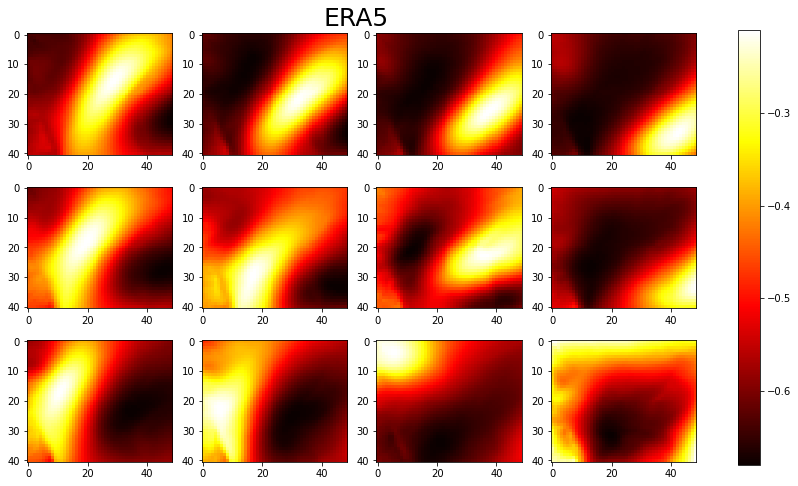

In [48]:
plot_som(composites_ERA5, 'ERA5')

<Figure size 432x288 with 0 Axes>

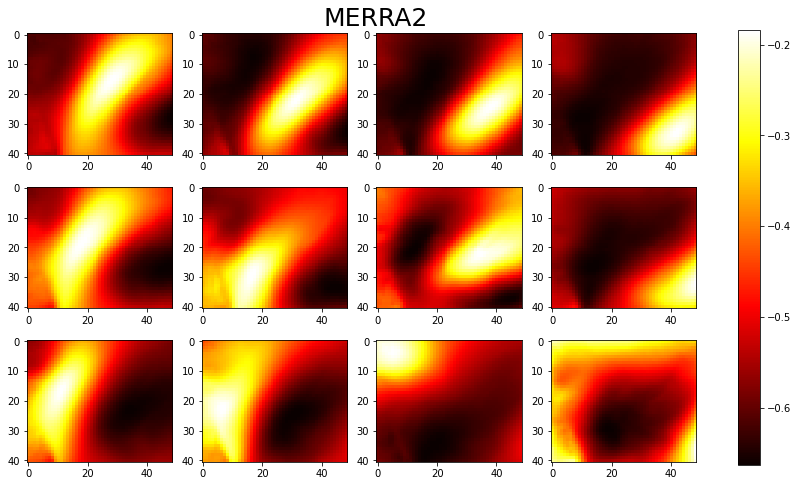

In [49]:
plot_som(composites_MERRA2, 'MERRA2')

<Figure size 432x288 with 0 Axes>

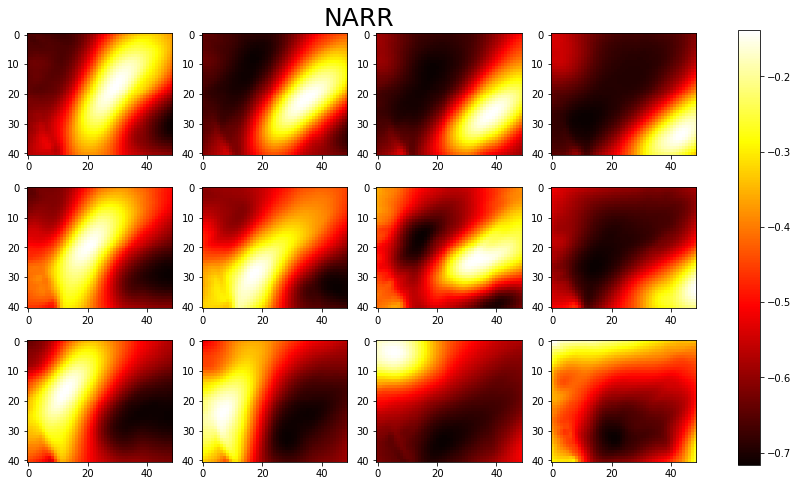

In [50]:
plot_som(composites_NARR, 'NARR')

# Correlation Analysis

In [51]:
for node in composites_ERA5.keys():
    patt_ERA5 = composites_ERA5[node]
    patt_MERRA2 = composites_MERRA2[node]
    print('ERA5 node {} MERRA2 node {}: {}'.format(node, node, np.round(stats.pearsonr(patt_ERA5, patt_MERRA2),3)))
    

ERA5 node (0, 0) MERRA2 node (0, 0): [0.998 0.   ]
ERA5 node (0, 1) MERRA2 node (0, 1): [0.997 0.   ]
ERA5 node (0, 2) MERRA2 node (0, 2): [0.996 0.   ]
ERA5 node (0, 3) MERRA2 node (0, 3): [0.998 0.   ]
ERA5 node (1, 0) MERRA2 node (1, 0): [0.997 0.   ]
ERA5 node (1, 1) MERRA2 node (1, 1): [0.989 0.   ]
ERA5 node (1, 2) MERRA2 node (1, 2): [0.994 0.   ]
ERA5 node (1, 3) MERRA2 node (1, 3): [0.999 0.   ]
ERA5 node (2, 0) MERRA2 node (2, 0): [0.999 0.   ]
ERA5 node (2, 1) MERRA2 node (2, 1): [0.996 0.   ]
ERA5 node (2, 2) MERRA2 node (2, 2): [0.999 0.   ]
ERA5 node (2, 3) MERRA2 node (2, 3): [0.994 0.   ]


In [52]:
for node in composites_ERA5.keys():
    patt_ERA5 = composites_ERA5[node]
    patt_NARR = composites_NARR[node]
    print('ERA5 node {} NARR node {}: {}'.format(node, node, np.round(stats.pearsonr(patt_ERA5, patt_NARR),3)))

ERA5 node (0, 0) NARR node (0, 0): [0.981 0.   ]
ERA5 node (0, 1) NARR node (0, 1): [0.983 0.   ]
ERA5 node (0, 2) NARR node (0, 2): [0.992 0.   ]
ERA5 node (0, 3) NARR node (0, 3): [0.996 0.   ]
ERA5 node (1, 0) NARR node (1, 0): [0.973 0.   ]
ERA5 node (1, 1) NARR node (1, 1): [0.996 0.   ]
ERA5 node (1, 2) NARR node (1, 2): [0.979 0.   ]
ERA5 node (1, 3) NARR node (1, 3): [0.998 0.   ]
ERA5 node (2, 0) NARR node (2, 0): [0.971 0.   ]
ERA5 node (2, 1) NARR node (2, 1): [0.992 0.   ]
ERA5 node (2, 2) NARR node (2, 2): [0.996 0.   ]
ERA5 node (2, 3) NARR node (2, 3): [0.977 0.   ]


In [53]:
for node in composites_MERRA2.keys():
    patt_MERRA2 = composites_MERRA2[node]
    patt_NARR = composites_NARR[node]
    print('MERRA2 node {} NARR node {}: {}'.format(node, node, np.round(stats.pearsonr(patt_MERRA2, patt_NARR),3)))

MERRA2 node (0, 0) NARR node (0, 0): [0.967 0.   ]
MERRA2 node (0, 1) NARR node (0, 1): [0.969 0.   ]
MERRA2 node (0, 2) NARR node (0, 2): [0.979 0.   ]
MERRA2 node (0, 3) NARR node (0, 3): [0.992 0.   ]
MERRA2 node (1, 0) NARR node (1, 0): [0.955 0.   ]
MERRA2 node (1, 1) NARR node (1, 1): [0.985 0.   ]
MERRA2 node (1, 2) NARR node (1, 2): [0.972 0.   ]
MERRA2 node (1, 3) NARR node (1, 3): [0.996 0.   ]
MERRA2 node (2, 0) NARR node (2, 0): [0.964 0.   ]
MERRA2 node (2, 1) NARR node (2, 1): [0.986 0.   ]
MERRA2 node (2, 2) NARR node (2, 2): [0.995 0.   ]
MERRA2 node (2, 3) NARR node (2, 3): [0.957 0.   ]


In [54]:
for node_ERA5 in composites_ERA5.keys():
    patt_ERA5 = composites_ERA5[node_ERA5]
    for node_MERRA2 in composites_MERRA2.keys():
        if node_ERA5 == node_MERRA2:
            continue
        patt_MERRA2 = composites_MERRA2[node_MERRA2]
        r, _ = stats.pearsonr(patt_ERA5, patt_MERRA2)
        if r >= 0.5:
            print('ERA5 node {} MERRA2 node {}: {}'.format(node_ERA5, node_MERRA2, stats.pearsonr(patt_ERA5, patt_MERRA2)))

ERA5 node (0, 0) MERRA2 node (0, 1): (0.6547835093631389, 2.6053084651646673e-246)
ERA5 node (0, 0) MERRA2 node (1, 0): (0.5124547390685855, 5.951396624356448e-135)
ERA5 node (0, 0) MERRA2 node (1, 1): (0.6057879741690589, 1.552217764746496e-201)
ERA5 node (0, 1) MERRA2 node (0, 0): (0.5807632488312306, 1.5381840662216712e-181)
ERA5 node (0, 1) MERRA2 node (0, 2): (0.7297899502433844, 0.0)
ERA5 node (0, 1) MERRA2 node (1, 2): (0.8084793501349018, 0.0)
ERA5 node (0, 2) MERRA2 node (0, 1): (0.6399051333573633, 7.571220899064437e-232)
ERA5 node (0, 2) MERRA2 node (0, 3): (0.6823153049378793, 2.3320119038368133e-275)
ERA5 node (0, 2) MERRA2 node (1, 2): (0.7382746770391012, 0.0)
ERA5 node (0, 2) MERRA2 node (1, 3): (0.5134853592147716, 1.4072794025738637e-135)
ERA5 node (0, 3) MERRA2 node (0, 2): (0.58825865130695, 2.403027668767054e-187)
ERA5 node (0, 3) MERRA2 node (1, 3): (0.9596614764688937, 0.0)
ERA5 node (1, 0) MERRA2 node (0, 0): (0.5816580900905863, 3.1751085576938376e-182)
ERA5 no

In [55]:
for node_ERA5 in composites_ERA5.keys():
    patt_ERA5 = composites_ERA5[node_ERA5]
    for node_NARR in composites_NARR.keys():
        if (node_NARR == node_ERA5):
            continue
        patt_NARR = composites_NARR[node_NARR]
        r, _ = stats.pearsonr(patt_ERA5, patt_NARR)
        if r >= 0.5:
            print('ERA5 node {} NARR node {}: {}'.format(node_ERA5, node_NARR, stats.pearsonr(patt_ERA5, patt_NARR)))

ERA5 node (0, 0) NARR node (0, 1): (0.507079183839646, 1.0147070356342885e-131)
ERA5 node (0, 0) NARR node (1, 0): (0.6921226866613048, 1.6926378681062994e-286)
ERA5 node (0, 0) NARR node (1, 1): (0.711488736279679, 7.28502137832446e-310)
ERA5 node (0, 1) NARR node (0, 0): (0.7598595756589283, 0.0)
ERA5 node (0, 1) NARR node (0, 2): (0.6168299118770506, 6.1408060070835136e-211)
ERA5 node (0, 1) NARR node (1, 2): (0.7454133010281896, 0.0)
ERA5 node (0, 2) NARR node (0, 1): (0.7964424925294903, 0.0)
ERA5 node (0, 2) NARR node (0, 3): (0.6124940563498288, 3.348570870872622e-207)
ERA5 node (0, 2) NARR node (1, 2): (0.7860647249479824, 0.0)
ERA5 node (0, 3) NARR node (0, 2): (0.7258622693137997, 0.0)
ERA5 node (0, 3) NARR node (1, 3): (0.9466909867233064, 0.0)
ERA5 node (1, 0) NARR node (1, 1): (0.7442377866498225, 0.0)
ERA5 node (1, 0) NARR node (2, 0): (0.7394227843670976, 0.0)
ERA5 node (1, 1) NARR node (0, 0): (0.6315511360292354, 4.510379034452855e-224)
ERA5 node (1, 1) NARR node (1, 0

In [56]:
for node_MERRA2 in composites_MERRA2.keys():
    patt_MERRA2 = composites_MERRA2[node_MERRA2]
    for node_NARR in composites_NARR.keys():
        patt_NARR = composites_NARR[node_NARR]
        r, _ = stats.pearsonr(patt_MERRA2, patt_NARR)
        if r >= 0.9:
            print('MERRA2 node {} NARR node {}: {}'.format(node_MERRA2, node_NARR, stats.pearsonr(patt_MERRA2, patt_NARR)))

MERRA2 node (0, 0) NARR node (0, 0): (0.9673692316479772, 0.0)
MERRA2 node (0, 1) NARR node (0, 1): (0.9691714355030718, 0.0)
MERRA2 node (0, 2) NARR node (0, 2): (0.979009180893026, 0.0)
MERRA2 node (0, 3) NARR node (0, 3): (0.9924591700436183, 0.0)
MERRA2 node (0, 3) NARR node (1, 3): (0.9354168408085272, 0.0)
MERRA2 node (1, 0) NARR node (1, 0): (0.9550557166336747, 0.0)
MERRA2 node (1, 1) NARR node (1, 1): (0.9852915176534848, 0.0)
MERRA2 node (1, 2) NARR node (1, 2): (0.9719834142512767, 0.0)
MERRA2 node (1, 3) NARR node (0, 3): (0.9687963776324603, 0.0)
MERRA2 node (1, 3) NARR node (1, 3): (0.9961184194855452, 0.0)
MERRA2 node (2, 0) NARR node (2, 0): (0.9636903571355895, 0.0)
MERRA2 node (2, 0) NARR node (2, 1): (0.9615155602309566, 0.0)
MERRA2 node (2, 1) NARR node (2, 1): (0.9860733432456222, 0.0)
MERRA2 node (2, 2) NARR node (2, 2): (0.995076654568222, 0.0)
MERRA2 node (2, 3) NARR node (2, 3): (0.9569935538592116, 0.0)


In [57]:
common = 0
for day in winmap_ERA5[0,1]:
    if day in winmap_MERRA2[2,0]:
        common+=1
print(common)

0


In [58]:
for node in winmap_ERA5.keys():
    if 0 in winmap_ERA5[node]:
        print(node)

In [59]:
stats.pearsonr(data_ERA5[2], data_ERA5[3])

(-0.06377625624873594, 0.004240373830550475)

In [60]:
winmap_ERA5

defaultdict(list,
            {(2, 3): [1,
              2,
              3,
              34,
              37,
              57,
              82,
              101,
              107,
              108,
              109,
              110,
              111,
              112,
              113,
              124,
              125,
              157,
              158,
              159,
              160,
              161,
              162,
              164,
              165,
              173,
              175,
              184,
              185,
              203,
              204,
              208,
              226,
              227,
              232,
              233,
              234,
              242,
              245,
              246,
              248,
              252,
              253,
              254,
              255,
              256,
              257,
              258,
              259,
              260,
              262,
              2

In [61]:
winmap_MERRA2

defaultdict(list,
            {(2, 3): [1,
              2,
              3,
              33,
              34,
              37,
              57,
              82,
              101,
              107,
              108,
              109,
              110,
              111,
              113,
              124,
              125,
              157,
              158,
              159,
              160,
              161,
              162,
              164,
              165,
              173,
              175,
              184,
              185,
              203,
              204,
              205,
              208,
              226,
              227,
              232,
              233,
              234,
              242,
              245,
              246,
              248,
              252,
              253,
              254,
              255,
              256,
              257,
              258,
              259,
              260,
              26

In [62]:
winmap_NARR

defaultdict(list,
            {(1, 3): [1,
              5,
              9,
              14,
              32,
              42,
              57,
              61,
              74,
              92,
              101,
              120,
              124,
              125,
              126,
              127,
              142,
              154,
              156,
              157,
              173,
              174,
              176,
              183,
              193,
              194,
              199,
              202,
              204,
              209,
              212,
              261,
              265,
              266,
              267,
              268,
              272,
              278,
              309,
              311,
              314,
              315,
              316,
              317,
              326,
              340,
              349,
              359,
              366,
              369,
              370,
              371,